# How to Build a Causal Inference Machine Learning Model to Prove that Global Warming is Caused by Human Activity

## How to use the DoWhy library to build a causal inference climate change model showing  that global warming is caused by human activity


Photo by <a href="https://unsplash.com/@worldsbetweenlines?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Patrick Hendry</a> on <a href="https://unsplash.com/s/photos/climate-change?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>

## Introduction

I published an article recently called https://towardsdatascience.com/a-simple-explanation-of-causal-inference-in-python-357509506f31 to provide a simple tutorial of how to get up and running with causal inference using the pgmpy library.

One of the readers of the article pointed out that the simple nature of the data (for example vaccination = 1 or 0, diesease = 1 or 0) meant that causal inference models could only be used to solve relatively simple problems and hence it might have limited applicability to real-world problems.

This prompted me to look for a BIG problem to try to solve using a causal inference model. I chose "Global Warming" and in particular climate denial for these reasons -

- If I could develop a working model it would refute the proposal that causal inference is limited to solving simple problems.
- There are datasets available (if you look hard enough!).
- It is current and topical with the United Nations COP27 Summit currently being held in Sharm El-Sheikh in Egypt.

## Getting the Data
The key data sources used in the model are -

- World Bank Data
- Global Monitoring Laboratory
- NASA

All of these data sources are available for public use. The full details including licenses and terms-of-use can be found in the "References" section at the end of the article.

Here is the climate data ...

In [1]:
import pandas as pd

df_climate_change = pd.read_excel("data/climate_change.xlsx", index_col="Year").loc[1960:2013]
df_climate_change

,POP,URB,GDP,ENGY,FFEC%,NFFEC%,FFEC,NFFEC,CO2E,CO2C,TMPI,TMPA
Year,,,,,,,,,,,,
1960,30.945383,9.331689,0.634565,7.503619,0.940,0.060,7.053402,0.450217,9.39,316.91,0.03,-0.115487
1961,31.353506,9.609697,0.661576,7.815869,0.941,0.059,7.354733,0.461136,9.42,317.64,0.01,-0.019997
1962,31.910116,9.922943,0.703998,8.233697,0.942,0.058,7.756143,0.477554,9.75,318.45,-0.01,-0.064054
1963,32.601631,10.268884,0.747172,8.568914,0.944,0.056,8.089055,0.479859,10.27,318.99,-0.03,-0.036806
1964,33.298713,10.624365,0.810594,8.987576,0.940,0.060,8.448321,0.539255,10.83,319.62,-0.04,-0.305867
1965,34.013032,10.929057,0.970412,9.242548,0.940,0.060,8.687995,0.554553,11.32,320.04,-0.05,-0.204388
1966,34.764918,11.242312,1.073945,9.508609,0.940,0.060,8.938093,0.570517,11.87,321.37,-0.06,-0.148885
1967,35.514764,11.562401,1.120639,10.109397,0.940,0.060,9.502833,0.606564,12.24,322.18,-0.05,-0.117516
1968,36.282842,11.890684,1.183463,10.705037,0.940,0.060,10.062734,0.642302,12.91,323.05,-0.03,-0.168632


... and here is an explanation of the features ...

In [2]:
df_features = pd.read_excel("data/climate_features.xlsx", index_col="Feature Code")
df_features

,Feature Name,Unit,Source,Code
Feature Code,,,,
POP,Population,People (B),https://data.worldbank.org/,SP.POP.TOTL
URB,Urban Population,People (B),https://data.worldbank.org/,SP.URB.TOTL
GDP,GDP Per Capita,Current US$ (100K),https://data.worldbank.org/,NY.GDP.PCAP.CD
ENGY,Energy Use,Oil Equivalent per Capita (10K KG),https://data.worldbank.org/,EG.USE.PCAP.KG.OE
FFEC%,Fossil Fuel Energy Proportion,% of Total Energy Use,https://data.worldbank.org/,EG.USE.COMM.FO.ZS
NFFEC%,Non Fossil Fuel Energy Proportion,% of Total Energy Use,https://data.worldbank.org/,EG.USE.COMM.FO.ZS
FFEC,Fossil Fuel Energy Consumption,Oil Equivalent per Capita (10K KG),https://data.worldbank.org/,EG.USE.COMM.FO.ZS
NFFEC,Non Fossil Fuel Energy Consumption,Oil Equivalent per Capita (10K KG),https://data.worldbank.org/,EG.USE.COMM.FO.ZS
CO2E,CO2 Emissions,Metric Tons (B),https://www.statista.com/statistics/264699/wor...,EN.ATM.CO2E.KT


## Exploratory Data Analysis

I created a set of helpder functions to explore the climate change data which I have left out of the article to keep it more readable and concise. If you would like to download the functions to run the code for yourself please head over to https://gist.github.com/grahamharrison68/242e96697e8561cc8a5e9d6d087eeb7c.

In [11]:
#https://stackoverflow.com/questions/33176049/how-do-you-compute-the-confidence-interval-for-pearsons-r-in-python
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import log, sqrt, exp
from scipy.stats import norm

def plot_full_correlation(df_data : pd.DataFrame, figsize : tuple = (10, 10), decimal_places : int = 2):
    df_encoded = df_data.copy(deep=True)
    for col in df_encoded.select_dtypes(exclude=[np.number]): # Non-numeric data types must be label encoded so that they can be evaluated using .corr()
        df_encoded[col] = LabelEncoder().fit_transform(df_encoded[col])

    plt.figure(figsize=figsize)
    mask = np.triu(np.ones_like(df_encoded.corr(), dtype=bool))
    sns.heatmap(round(df_encoded.corr().abs(), decimal_places), annot=True, cmap='Reds', mask=mask)
    plt.show()

def r_to_z(r):
    return log((1 + r) / (1 - r)) / 2.0

def z_to_r(z):
    e = exp(2 * z)
    return((e - 1) / (e + 1))

def r_confidence_interval(r, alpha, n):
    z = r_to_z(r)
    se = 1.0 / sqrt(n - 3)
    z_crit = norm.ppf((1 + alpha)/2)  # 2-tailed z critical value

    lo = z - z_crit * se
    hi = z + z_crit * se

    return (z_to_r(lo), z_to_r(hi))

# https://cmdlinetips.com/2019/10/how-to-make-a-plot-with-two-different-y-axis-in-python-with-matplotlib/
def twin_plot(x_axis_values : pd.Series, 
              series_1_values : pd.Series, 
              series_2_values : pd.Series, 
              x_label : str, 
              series_1_label: str, 
              series_2_label : str, 
              series_1_color : str = "red", 
              series_2_color : str = "blue", 
              series_2_x_shift : int = 0, 
              figsize : tuple = (12, 8), 
              title : str = ""):
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(x_axis_values, series_1_values, color=series_1_color, marker="o")
    ax.set_xlabel(x_label, fontsize = 14)
    ax.set_ylabel(series_1_label, color=series_1_color, fontsize=14)


    ax2=ax.twinx()
    ax2.plot(x_axis_values + series_2_x_shift, series_2_values,color=series_2_color,marker="o")
    ax2.set_ylabel(series_2_label,color=series_2_color,fontsize=14)
    
    plt.title(title)
    
    plt.show()

def climate_title(series_1 : pd.Series, series_2 : pd.Series, alpha : float = 0.95, prefix : str = "") -> str:
    r = series_1.corr(series_2)
    n = len(series_1)
    
    lo_r, hi_r = r_confidence_interval(r, alpha, n)
    
    return f"{prefix}The correlation is {r:.1%} with {alpha:.0%} confidence that the correlation lies between {lo_r:.1%} and {hi_r:.1%}"
    
def climate_plot(series_1_feature : str, 
                 series_2_feature : str, 
                 x_axis_values : pd.Series = df_climate_change.index, 
                 title : str = "", 
                 x_label : str = "Year", 
                 series_2_x_shift : int = 0, 
                 figsize : tuple = (12, 8)):
    
    series_1_values = df_climate_change[series_1_feature]
    series_2_values = df_climate_change[series_2_feature]
    
    series_1_label = df_features.at[series_1_feature, "Feature Name"] + " (" + df_features.at[series_1_feature, "Unit"] + ")"
    series_2_label = df_features.at[series_2_feature, "Feature Name"] + " (" + df_features.at[series_2_feature, "Unit"] + ")"
    
    twin_plot(x_axis_values, 
              series_1_values, 
              series_2_values, 
              x_label, 
              series_1_label, 
              series_2_label, 
              series_2_x_shift = series_2_x_shift, 
              figsize=figsize, 
              title=climate_title(series_1 = series_1_values, series_2 = series_2_values, prefix=title))       

### Correlations

Let's start by taking a quick look at the correlations between the main features ...

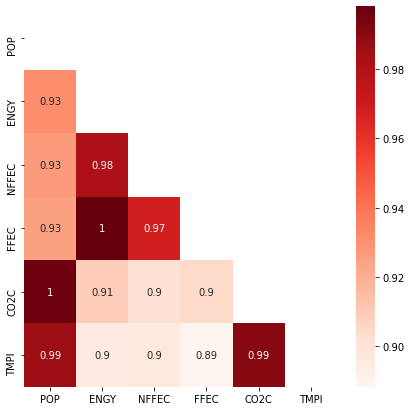

In [12]:
plot_full_correlation(df_climate_change[['POP', 'ENGY', 'NFFEC', 'FFEC', 'CO2C', 'TMPI']], decimal_places=4, figsize=(7, 7))

It appears that there are some high correlations so let's have a look at these relationships in more detail ...

### Population vs. Energy

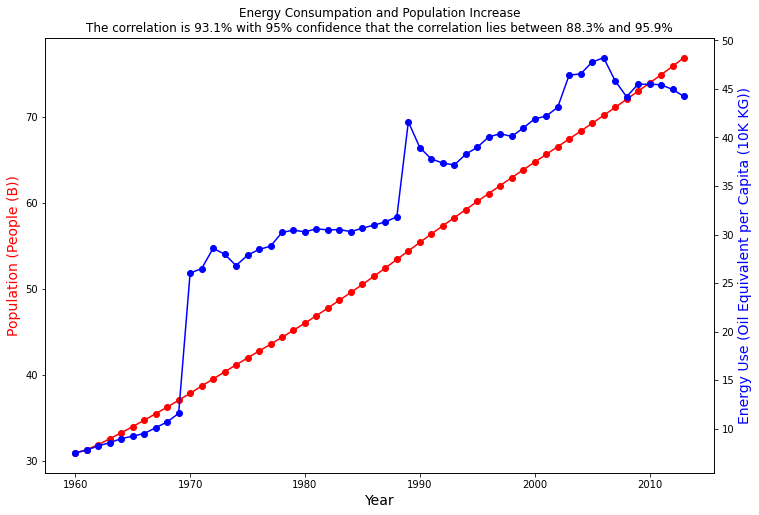

In [13]:
climate_plot(series_1_feature = "POP", series_2_feature= "ENGY", title="Energy Consumpation and Population Increase\n")

This comparison suggests a linear increase between world poulation increase and energy use, correlated with r=0.931.

### Overall Energy vs. Fossil Fuel Consumption

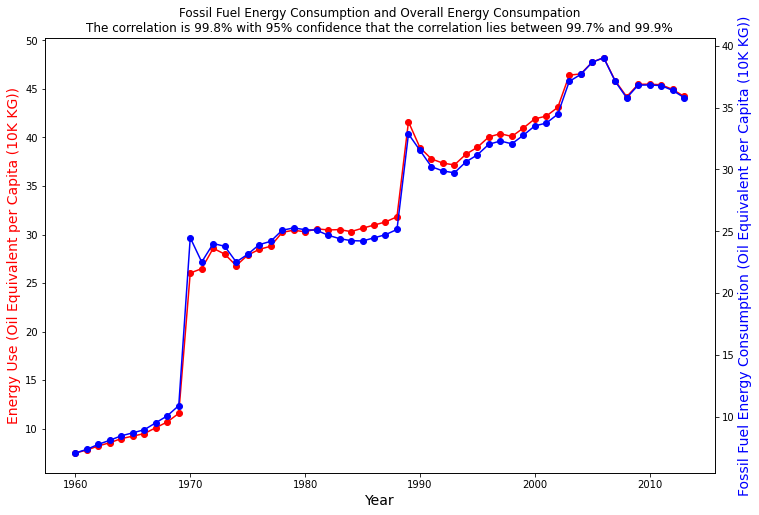

In [14]:
climate_plot(series_1_feature = "ENGY", series_2_feature= "FFEC", title="Fossil Fuel Energy Consumption and Overall Energy Consumpation\n")

There is a near-perfect correlation between overall energy use and fossil fuel use which is hardly surprising but still useful to visualise.

### Fossil Fuel Energy Consumption vs. CO2 Concentration

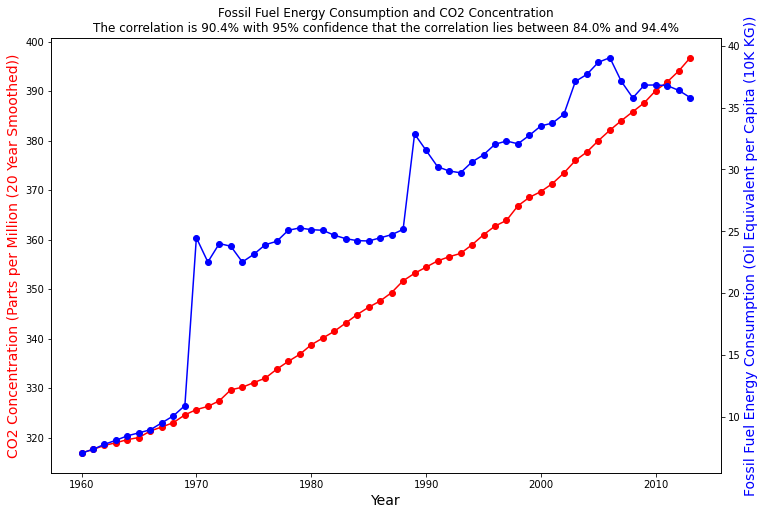

In [15]:
climate_plot(series_1_feature = "CO2C", series_2_feature= "FFEC", title="Fossil Fuel Energy Consumption and CO2 Concentration\n")

Again there is another strong correlation between Fossil Fuel Energy Consumption and CO2 concentration, but suspend any conclusions about cause-and-effect for now as this will be the subject of the next part of the article.

### CO2 Concentration vs. Temperature Change

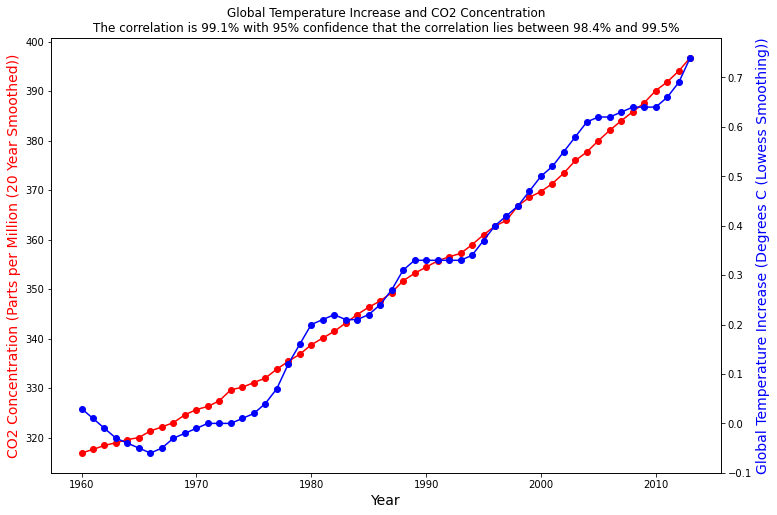

In [10]:
climate_plot(series_1_feature = "CO2C", series_2_feature= "TMPI", title="Global Temperature Increase and CO2 Concentration\n")

Lastly there is a correlative link is between carbon-dioxide emissions and temperature increase.

## Moving from Correlation to a Proposed Model for Causation

We know that the following correlative relationships have been proven -
    - Population increase correlates with increased energy consumption.
    - Increased energy consumption correlates with increased use of fossil fuels.
    - Fossil fuel use correlates with increased levels of CO2.
    - Increases in CO2 correlates with increases in temperature.
    
We all know the famous quotation attributed to Karl Pearson that "correlation does not imply causation" (https://thedecisionlab.com/reference-guide/philosophy/correlation-vs-causation) so what can we say, if anything, about moving beyond correaltion to a reasonable assumption of causation between human activity (energy consumption) and global warming?

Having read "The Book of Why" by Judea Pearl and having studied many other sources it is a reasonable conclusion that one of the following must be true if a correlation is found -

1. That the correlation implies causation.
2. That the correlation is caused by a "confounding" factor (more on this later).

.. and based on additional reading and research I would like to add a 3rd possibility -

3. That the correlation is entirely spurious and purely co-incidental.

Let's explore the 3 possibilities in a bit more detail ...

### Spurious Correlations
Consider the following which is my all-time favourite spurious correlation attributed to Tyler Vigen (see References section for attribution).

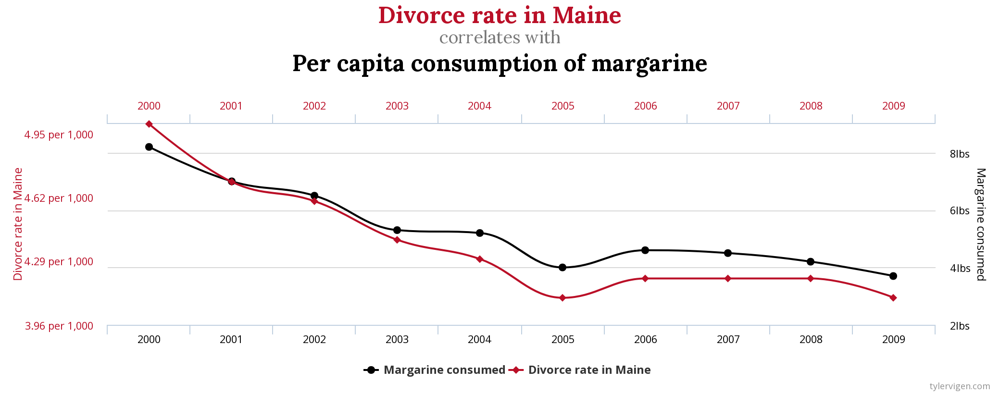

Proof will be hard to come by but surely every fibre of common sense screams out that the statement "couples who want to stay married should eat less margarine" cannot be true. Hence the correlation in the graph is teken to be completely spurious, co-incidental and accidental.

A highly correlated and completely spurious correlation would be difficult to refute in the real world but they can be reasonably challenged by 

- Asking domain experts.
- Looking out for wildly different y-axis in the data.
- Using confidence intervals.
- Continuing to monitor the data to see if the correlation continues or diverges in the future.

The confidence interval for margarine and divorce would be high so in that example we would need to find and ask experts in dairy products and marriage guidance to prove or refute the hypothesis that consuming margarine causes divorce.

### Confounding

To visualise the issue of confounding, let's return to our model and look at the correlation between non-fossil fuel consumption and CO2 emissions ...

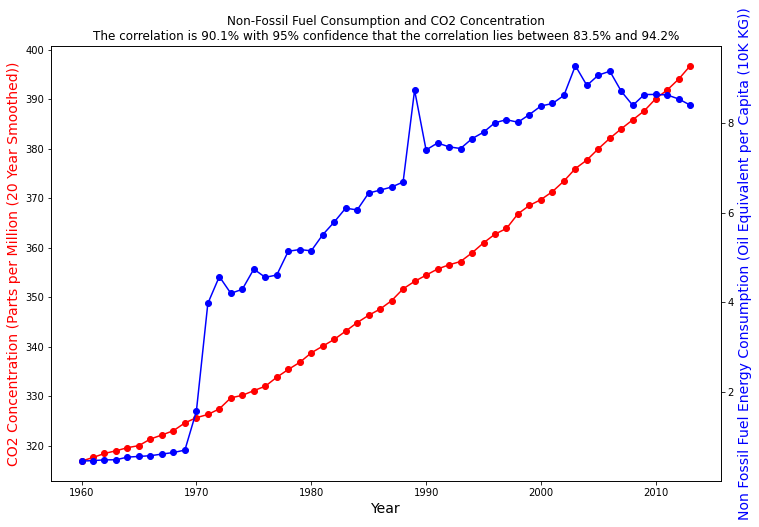

In [16]:
climate_plot(series_1_feature = "CO2C", series_2_feature= "NFFEC", title="Non-Fossil Fuel Consumption and CO2 Concentration\n")

On the face of it this is worrying and confusing. Non-fossil fuels are assumed to be nuclear power and renewables, neither of which cause CO2 emissions which in turn cause temperature increase (if a causal link can be established). 

So how can it be that the more non-fossil fuel energy we use the more global temperatures increase?

What is happening here is that increases in population cause more energy to be produced and consumed. As more energy is required this causes an increase in both fossil fuel and non-fossil fuel energy consumption.

The fossil-fuel energy consumption is causing the CO2 emissions (if we can prove our theories) but as energy increases both fossil and non-fossil energy consumption are increasing.

Energy is have a "confounding effect" which is leading to the correlation between non-fossil fuels and CO2 emissions.

Confounding effects can be a difficult concept to understand but I think this example illustrates it very nicely.

In summary there is a correlation between non-fossil fuel energy consumption and CO2 emissions that is neither causal nor spurious. It is wholly caused and explained by the confounding effect of energy on both non-fossil and fossil fuel energy consumption.

### Causation

“When you have eliminated all which is impossible, then whatever remains, however improbable, must be the truth.” (Arthur Conan Doyle, The Case-Book of Sherlock Holmes)

Therefore my dear Watson, I will propose that if there is a correlation between two sets of data that is neither spurious nor confounded then we can infer a causal link.

Before we go any further with this exploration of climate change data I would like to propose the following Directed Acyclic Graph to represent the causal relationship in the data ...

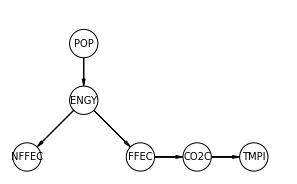

In [18]:
from dag_tools import DirectedAcyclicGraph

model_1_edges : list = [("POP", "ENGY"), ("ENGY", "NFFEC"), ("ENGY", "FFEC"), ("FFEC", "CO2C"), ("CO2C", "TMPI")]
model_1_pos : dict = {"NFFEC": [1, 1], "ENGY": [2, 2], "POP": [2, 3], "FFEC": [3, 1], "CO2C": [4, 1], "TMPI": [5, 1]}    
    
model_1 = DirectedAcyclicGraph(edges=model_1_edges)
model_1.display_pgm_model(pos=model_1_pos)

## The Big Question: Could Something Natural be Causing Global Warming?

There is a strong case for human impact cuasing global warming based on our model and the justifications put forward, but there are still many people who hold views on climate denial -

<b><i>Climate change denial, or global warming denial, is denial, dismissal, or doubt that contradicts the scientific consensus on climate change, including the extent to which it is caused by humans, its effects on nature and human society, or the potential of adaptation to global warming by human actions.</b></i>

https://en.wikipedia.org/wiki/Climate_change_denial#:~:text=Climate%20change%20denial%2C%20or%20global,global%20warming%20by%20human%20actions.


It would be very useful if we could extend the model developed so far to address this question and to provide some causal inference based evidence to refute it and to add to the weight opinion that global warming is caused by human activity.

I do not know of any way using non-causal machine learning models (i.e. regression, classification or neural networks) that can be used to approach this problem but causal inference can answer questions like this. 

Before we explore a machine learning solution we need to return to the concept of confounding. 

We know from our earlier example that Energy Utilisation is causal for both Fossil Fuel and Non-Fossil Fuel use and hence that Energy is "confounding" Non-Fossil use causing a correlation with CO2 emissions that is neither causal nor spurious.

What if there is a confounder that is causing CO2 levels to rise and temperatures to increase that we do not know about? That sounds unlikely but if it were the case it would weaken the case that non-fossil fuel energy consumption is wholly causing CO2 emissions and strengthen the view that natural causes are responsible.

If there is an unknown factor causing CO2 to increase and temperatures to increase it is certainly not part of the proposed DAG. Not only is it a confounder but it is an "unobserved confounder".

That would require the DAG to be reimagined as follows -

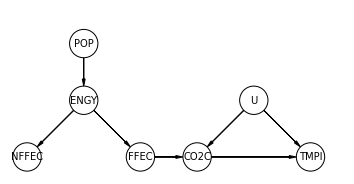

In [14]:
model_2_edges : list = [("POP", "ENGY"), ("ENGY", "NFFEC"), ("ENGY", "FFEC"), ("FFEC", "CO2C"), ("CO2C", "TMPI"), ("U", "CO2C"), ("U", "TMPI")]
model_2_pos : dict = {"NFFEC": [1, 1], "ENGY": [2, 2], "POP": [2, 3], "FFEC": [3, 1], "CO2C": [4, 1], "TMPI": [6, 1], "U": [5, 2]}        

model_2 = DirectedAcyclicGraph(edges=model_2_edges)
model_2.display_pgm_model(pos=model_2_pos)

Believe it or not, causal calculus can be used to provide a reliable measure of the impact of Fossil-Fuel energy use on temperature increase even if an unobserved confounder exists.

The maths is very complicated (and beyond me!) but fortunately some of the emerging set of Python libraries implementing causal inference implement unobserved confounding and some do not.

My favourite light-weight Python library for causal inference is ``Pgmpy`` but it does not implement unoberved confounding. I have documented this issue and raised a ticket which is currently being looked at. You can check the status of that ticket here - https://github.com/pgmpy/pgmpy/issues/1574.

Until ''Pgmpy'' does support unobserved confounding an alternative library is required and I have selected Microsoft's ``DoWhy`` library which is much more complext to use than ``Pgpmy`` but it will give the correct results ...

In [15]:
from dowhy import CausalModel
from dowhy.causal_estimator import CausalEstimate

In [16]:
model_1.nodes

['POP', 'ENGY', 'NFFEC', 'FFEC', 'CO2C', 'TMPI']

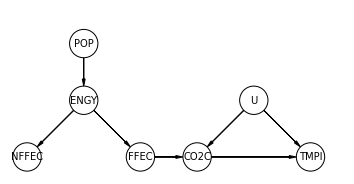

In [17]:
climate_edges : list = [("POP", "ENGY"), ("ENGY", "NFFEC"), ("ENGY", "FFEC"), ("FFEC", "CO2C"), ("CO2C", "TMPI"), ("U", "CO2C"), ("U", "TMPI")]
climate_features : list = ['POP', 'ENGY', 'NFFEC', 'FFEC', 'CO2C', 'TMPI'] 

climate_dag = DirectedAcyclicGraph(climate_edges)

climate_pos : dict = {"NFFEC": [1, 1], "ENGY": [2, 2], "POP": [2, 3], "FFEC": [3, 1], "CO2C": [4, 1], "TMPI": [6, 1], "U": [5, 2]}        
climate_dag.display_pgm_model(pos=model_2_pos)

In [18]:
treatment : str = "FFEC"
outcome : str = "TMPI"
    
climate_model = CausalModel(data=df_climate_change[climate_features], 
                            graph=climate_dag.gml_graph, 
                            treatment=treatment, 
                            outcome=outcome)

climate_estimand = climate_model.identify_effect()
print(climate_estimand)

climate_estimate = climate_model.estimate_effect(identified_estimand=climate_estimand, method_name='iv.instrumental_variable')

Estimand type: nonparametric-ate

### Estimand : 1
Estimand name: backdoor
Estimand expression:
   d                      
───────(Expectation(TMPI))
d[FFEC]                   
Estimand assumption 1, Unconfoundedness: If U→{FFEC} and U→TMPI then P(TMPI|FFEC,,U) = P(TMPI|FFEC,)

### Estimand : 2
Estimand name: iv
Estimand expression:
Expectation(Derivative(TMPI, [ENGY])*Derivative([FFEC], [ENGY])**(-1))
Estimand assumption 1, As-if-random: If U→→TMPI then ¬(U →→{ENGY})
Estimand assumption 2, Exclusion: If we remove {ENGY}→{FFEC}, then ¬({ENGY}→TMPI)

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!

instrumental_variable


In [19]:
def print_climate_ate(estimate : CausalEstimate, treatment : str, outcome : str):
    treatment_name = df_features.loc[treatment, "Feature Name"]
    outcome_name = df_features.loc[outcome, "Feature Name"]
    
    treatment_unit = df_features.loc[treatment, "Unit"]
    outcome_unit = df_features.loc[outcome, "Unit"]
    
    pos_neg = "+" if estimate.value >= 0 else "-"
    
    title_str = f'Average Treatment Effect (ATE):\n'
    treatment_str = f'For every unit change (1 unit = 1 x {treatment_unit}) in "{treatment_name}" ...\n'
    outcome_str = f'"{outcome_name}" will change by {pos_neg}{estimate.value} (1 unit = 1 x {outcome_unit})'
    
    print(title_str + treatment_str + outcome_str)

In [20]:
print_climate_ate(estimate=climate_estimate, treatment="FFEC", outcome="TMPI")

Average Treatment Effect (ATE):
For every unit change (1 unit = 1 x Oil Equivalent per Capita (10K KG)) in "Fossil Fuel Energy Consumption" ...
"Global Temperature Increase" will change by +0.02322620230983087 (1 unit = 1 x Degrees C (Lowess Smoothing))


And there we have it! Even if there is an unobserved confounder with a causal effect on both CO2 levels and global temperature increases, increasing the consumption of non-fossil fuel energy stil has a significant causal effect on increasing global temperature.

Effectively this simple implementation of causal inference using Microsoft's ``DoWhy`` library can be used to refute climate change denial and to provide a reliable estimate of by how much temperature will increase as non-fossil fuel energy consumption increases!

# References
- Global Warming Blog by Henry Auer, https://warmgloblog.blogspot.com/2013/06/co2-and-temperature-changes-are.html?m=1
- Population Data: World Bank Data, https://data.worldbank.org/, dataset SP.POP.TOTL,  CC BY 4.0 license 
- Urban Population Data: World Bank Data, https://data.worldbank.org/, dataset SP.URB.TOTL,  CC BY 4.0 license 
- GDP per Capita: World Bank Data, https://data.worldbank.org/, dataset NY.GDP.PCAP.CD,  CC BY 4.0 license 
- Total Energy Use Data: World Bank Data, https://data.worldbank.org/, dataset EG.USE.PCAP.KG.OE,  CC BY 4.0 license 
- Fossil Fuel Energy Use Data: World Bank Data, https://data.worldbank.org/, dataset EG.USE.COMM.FO.ZS,  CC BY 4.0 license 
- Non Fossil Fuel Energy Use Data: World Bank Data, https://data.worldbank.org/, dataset EG.USE.COMM.FO.ZS,  CC BY 4.0 license 
- CO2 Concentration Data: Global Monitoring Laboratory (https://gml.noaa.gov/), ftp.cmdl.noaa.gov/ccg/co2/trends/co2_annmean_mlo.txt, "data made freely available to the public"
- Temperature Data: NASA Global Climate Change, https://climate.nasa.gov/vital-signs/global-temperature/, License: with credit (https://climate.nasa.gov/faq/32/may-i-use-content-and-imagery-from-your-website-if-so-to-whom-do-i-credit-them/)
- Temperature Data: NASA Global Climate Change. (2021). Retrieved 13/11/2022, from https://climate.nasa.gov/vital-signs/global-temperature/
- CC BY 4.0 License - https://data.worldbank.org/summary-terms-of-use
- Twinplot: https://cmdlinetips.com/2019/10/how-to-make-a-plot-with-two-different-y-axis-in-python-with-matplotlib/
- Spurious Correlations, https://www.tylervigen.com/spurious-correlations, Creative Commons Attribution License (https://www.tylervigen.com/about)